---
# From occurrence points to SDM and lake analyses
## A workflow using `hydrographr` functions
---

---

# Workflow overview


---

![title](./img/workflow_20260323.png)   

# Part 1: Snapping workflow

Field-collected coordinates, e.g. of species occurrences or
dam locations, rarely fall exactly on a stream line of a modelled stream network. Before
conducting any network analysis, each point must be **snapped** to its nearest
appropriate stream segment.

This vignette presents a workflow for snapping coordinates to the stream network:

The workflow uses the **GeoFRESH pygeoapi** service via `hydrographr` API
helper functions, which means that everything runs on the side of the server, and no local raster data is needed to be downloaded or pre-processed.

The workflow consists of the following steps:

1. **Snap all points** to the stream network
2. **Extract basin IDs and the corresponding stream networks** for the snapped points
3. **Prune the network to suitable stream orders**
4. **Obtain environmental variables characterizing the streams of the study area**


---

# Setup

In [2]:
library(hydrographr)   # (branch "workflow" containing API wrapper functions)
library(data.table)    # fast data I/O
library(dplyr)         # data manipulation
library(sf)            # spatial features
library(leaflet)       # interactive maps
library(htmlwidgets)   # save maps to HTML
library(ggplot2)       # plotting

Warning message:
“replacing previous import ‘data.table::first’ by ‘dplyr::first’ when loading ‘hydrographr’”
Warning message:
“replacing previous import ‘data.table::between’ by ‘dplyr::between’ when loading ‘hydrographr’”
Warning message:
“replacing previous import ‘data.table::last’ by ‘dplyr::last’ when loading ‘hydrographr’”
Warning message:
“replacing previous import ‘dplyr::as_data_frame’ by ‘igraph::as_data_frame’ when loading ‘hydrographr’”

Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Linking to GEOS 3.12.0, GDAL 3.7.2, PROJ 9.3.0; sf_use_s2() is TRUE

Warning message:
“package ‘leaflet’ was built under R version 4.3.3”


---

# Step 1: Snap Points to the Stream Network

## Load the input data

The input test CSV is hosted on Nimbus. It should contain at minimum a site ID, longitude, and latitude column.

In [7]:
#gbif_url  <- "https://nimbus.igb-berlin.de/index.php/s/tawfdYanHB3DPgS/download/fish_gbif_from_sp_list_clean_to_snap.csv"
# Or:
gbif_url <- "./fish_gbif_from_sp_list_clean_to_snap.csv"

gbif_original  <- fread(gbif_url)

message(sprintf("GBIF points: %d", nrow(gbif_original)))
head(gbif_original)

GBIF points: 1333



gbifID,datasetKey,class,order,family,genus,species,year,month,day,decimalLongitude,decimalLatitude
<int64>,<chr>,<lgl>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<dbl>
5087649733,50c9509d-22c7-4a22-a47d-8c48425ef4a7,NA,Cypriniformes,Cyprinidae,Abramis,Abramis brama,2025,3,10,23.37377,40.68721
4014864440,50c9509d-22c7-4a22-a47d-8c48425ef4a7,NA,Cypriniformes,Cyprinidae,Abramis,Abramis brama,2021,5,29,23.36175,40.66542
3346832478,d8cd16ba-bb74-4420-821e-083f2bac17c2,NA,Cypriniformes,Cyprinidae,Abramis,Abramis brama,2007,2,22,23.54000,40.66000
2429267341,50c9509d-22c7-4a22-a47d-8c48425ef4a7,NA,Cypriniformes,Cyprinidae,Abramis,Abramis brama,2019,9,14,23.67356,40.94868
1804039970,dc3bfd08-0141-45ae-9603-91ac50cdc33b,NA,Cypriniformes,Cyprinidae,Abramis,Abramis brama,1976,1,10,23.50000,40.66670
1262935657,c2e3081a-ba91-40cf-b2df-9885a24b37dc,NA,Cypriniformes,Cyprinidae,Abramis,Abramis brama,2013,1,31,23.50000,40.68000


## The cascade snapping approach

Rather than snapping all points to a single Strahler order, we use
`api_get_snapped_points_cascade()`. This tries higher-order (larger) streams
first, accepting any point that snaps within the distance threshold, and
progressively falls back to lower orders for the rest.

```
  Input: N points
        │
  ┌─────▼──────────────────────────────────────────────┐
  │  Strahler ≥ 4 (try first)                          │
  │    ├─ distance < threshold  →  ✓ accepted          │
  │    └─ distance ≥ threshold  →  retry ──────────►  │
  ├────────────────────────────────────────────────────┤
  │  Strahler ≥ 3                                      │
  │    ├─ distance < threshold  →  ✓ accepted          │
  │    └─ distance ≥ threshold  →  retry ──────────►  │
  ├────────────────────────────────────────────────────┤
  │  Strahler ≥ 2 (last resort)                        │
  │    ├─ distance < threshold  →  ✓ accepted          │
  │    └─ distance ≥ threshold  →  ✗ not included      │
  └────────────────────────────────────────────────────┘
        │
  Output: snapped points with coordinates,
          subc_id, strahler, distance_metres
```

> **Note:** each retry uses the *original* coordinates, not the
> previously snapped location.

## Snapping parameters

In [8]:
STRAHLER_SEQ       <- c(4, 3, 2)
DISTANCE_THRESHOLD <- 400   # meters

## Snap GBIF occurrence data

GBIF data uses different column names (`decimalLongitude`, `decimalLatitude`,
`gbifID`) — these are passed through the `colname_*` arguments.

In [9]:
# Note: This code may take 2-3 minutes
gbif_snap_result <- api_get_snapped_points_cascade(
  data               = gbif_original,
  colname_lon        = "decimalLongitude",
  colname_lat        = "decimalLatitude",
  colname_site_id    = "gbifID",
  strahler_seq       = STRAHLER_SEQ,
  distance_threshold = DISTANCE_THRESHOLD
)

message(sprintf("GBIF: snapped %d / %d points",
                nrow(gbif_snap_result), nrow(gbif_original)))

dir.create("points_snapped")
fwrite(gbif_snap_result,
       paste0("points_snapped/gbif_snapped_min_strahler",
              min(STRAHLER_SEQ), "_dist", DISTANCE_THRESHOLD, ".csv"))


=== Starting Cascade for 1333 points ===

Strahler sequence: 4 → 3 → 2

Distance threshold: 400 meters



=== Strahler 4 (Level 1/3) ===


Points to snap: 1333

Dataset has 1333 points (>= 500 threshold). Using async mode.

Processing 1333 points...

Converting data.frame to GeoJSON...

✓ GeoJSON created

Sending request to API...


Async job submitted successfully!

  Job ID: 8d31ba4b-26a8-11f1-8a34-62064780fa0b

  Status: accepted


Polling for completion (checking every 10 seconds)...

[0s] Status: accepted | Progress: 5%

[10s] Status: accepted | Progress: 5%

[20s] Status: accepted | Progress: 5%

[30s] Status: accepted | Progress: 5%

[40s] Status: accepted | Progress: 5%

[50s] Status: accepted | Progress: 5%

[60s] Status: accepted | Progress: 5%

[70s] Status: successful | Progress: 100%

✓ Job 8d31ba4b-26a8-11f1-8a34-62064780fa0b completed successfully!

✓ Snapping complete. Downloading results...

✓ Downloaded 1333 rows, 8 columns

✓ Snapped 1333 points


Distance summary:


The result is a data frame with one row per successfully snapped point. The
key output columns are:

| Column | Description |
|---|---|
| `site_id` | Your original point identifier |
| `subc_id` | Sub-catchment ID of the snapped location |
| `strahler` | Strahler order of the stream segment snapped to |
| `longitude_snapped` / `latitude_snapped` | New coordinates on the stream |
| `longitude_original` / `latitude_original` | Original input coordinates |
| `distance_metres` | How far the point was moved |

## Inspecting snapping statistics

Always check the snapping distance distribution after running the cascade.

In [10]:
# Quick summary
summary(gbif_snap_result$distance_metres)

# How many points were not snapped?
n_failed <- nrow(gbif_original) - nrow(gbif_snap_result)
message(sprintf("Failed to snap: %d (%.1f%%)",
                n_failed, 100 * n_failed / nrow(gbif_snap_result)))

# Points by Strahler level
table(gbif_snap_result$strahler)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   0.00   53.04  116.77  151.48  253.76  396.28 

Failed to snap: 329 (32.8%)




  2   3   4   5   6   7   8   9 
262 174 188 163 114  67  31   5 

---

# Step 2: Visualise Snapping Results

An interactive map lets you visually verify that points landed on the correct
stream segments.

- **Blue** = original position, successfully snapped
- **Orange** = original position, failed to snap
- **Red** = final snapped position
- **Grey lines** = distance vectors (original → snapped)

## GBIF map

In [11]:
# ============================================================================
# VISUALISE GBIF SNAPPING
# ============================================================================

# Flag which original points were successfully snapped
gbif_snapped_ids      <- gbif_snap_result$gbifID
gbif_original$snapped <- gbif_original$gbifID %in% gbif_snapped_ids

n_snapped_gbif <- sum(gbif_original$snapped)
n_failed_gbif  <- sum(!gbif_original$snapped)
message(sprintf("Successfully snapped: %d", n_snapped_gbif))
message(sprintf("Failed to snap:       %d", n_failed_gbif))

# Displacement lines
snap_lines_gbif <- lapply(seq_len(nrow(gbif_snap_result)), function(i) {
  st_linestring(matrix(c(
    gbif_snap_result$decimalLongitude_original[i],
    gbif_snap_result$decimalLatitude_original[i],
    gbif_snap_result$decimalLongitude_snapped[i],
    gbif_snap_result$decimalLatitude_snapped[i]
  ), ncol = 2, byrow = TRUE))
}) %>% st_sfc(crs = 4326)



gbif_map <- leaflet() %>%
  addTiles(group = "OpenStreetMap") %>%
  addProviderTiles(providers$Esri.WorldImagery, group = "Satellite") %>%

  # Original — successfully snapped (blue)
  addCircleMarkers(
    data  = gbif_original[gbif_original$snapped, ],
    lng   = ~decimalLongitude,
    lat   = ~decimalLatitude,
    color = "blue", fillColor = "blue",
    radius = 4, fillOpacity = 0.6, weight = 1,
    group = "Original (Snapped)",
    popup = ~paste0(
      "<b>Original (snapped)</b><br>",
      "GBIF ID: ", gbifID, "<br>",
      "Lon: ", round(decimalLongitude, 5), "<br>",
      "Lat: ", round(decimalLatitude, 5)
    )
  ) %>%

  # Original — failed to snap (orange)
  addCircleMarkers(
    data  = gbif_original[!gbif_original$snapped, ],
    lng   = ~decimalLongitude,
    lat   = ~decimalLatitude,
    color = "orange", fillColor = "orange",
    radius = 5, fillOpacity = 0.9, weight = 3,
    group = "Original (Failed)",
    popup = ~paste0(
      "<b> Failed to snap</b><br>",
      "GBIF ID: ", gbifID, "<br>",
      "Lon: ", round(decimalLongitude, 5), "<br>",
      "Lat: ", round(decimalLatitude, 5)
    )
  ) %>%

  # Snapped positions (red)
  addCircleMarkers(
    data  = gbif_snap_result,
    lng   = ~decimalLongitude_snapped,
    lat   = ~decimalLatitude_snapped,
    color = "red", fillColor = "red",
    radius = 4, fillOpacity = 0.6, weight = 1,
    group = "Snapped Points",
    popup = ~paste0(
      "<b>Snapped</b><br>",
      "GBIF ID: ", gbifID, "<br>",
      "Lon: ", round(decimalLongitude_snapped, 5), "<br>",
      "Lat: ", round(decimalLatitude_snapped, 5), "<br>",
      "Distance: ", round(distance_metres, 1), " m<br>",
      "Strahler: ", strahler
    )
  ) %>%

  # Displacement lines
  addPolylines(
    data    = snap_lines_gbif,
    color   = "gray", weight = 1, opacity = 0.3,
    group   = "Snap Lines"
  ) %>%

  addLayersControl(
    baseGroups    = c("OpenStreetMap", "Satellite"),
    overlayGroups = c("Original (Snapped)", "Original (Failed)",
                      "Snapped Points", "Snap Lines"),
    options = layersControlOptions(collapsed = FALSE)
  ) %>%
  addLegend(
    position = "bottomright",
    colors   = c("blue", "orange", "red", "gray"),
    labels   = c("Original (snapped)", "Original (failed)",
                 "Snapped position", "Displacement"),
    title    = "GBIF Data",
    opacity  = 0.7
  )

gbif_map
saveWidget(gbif_map, "gbif_snapping_check.html",
           selfcontained = TRUE)

Successfully snapped: 1004

Failed to snap:       329

Warning message in CPL_crs_from_input(x):
“GDAL Error 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed”


HTML widgets cannot be represented in plain text (need html)

---

# Step 3: Get Basin IDs and Download Stream Networks

## Retrieve basin IDs with `api_get_local_ids()`

`api_get_local_ids()` takes the snapped coordinates and returns the basin ID
(`basin_id`) for each point. This is needed to download the stream network vectors
of entire basins.

Because we already ran snapping (which returns `subc_id`), we pass that column
directly to skip the sub-catchment lookup in the database

In [12]:
# Note: This code may take half a minute or so
basin_ids <- api_get_local_ids(
  data            = gbif_snap_result,
  colname_lon     = "decimalLongitude_snapped",
  colname_lat     = "decimalLatitude_snapped",
  colname_site_id = "gbifID",
  colname_subc_id = "subc_id"       # already have this from snapping
)

# Merge basin IDs back onto the snapped data
gbif_snap_result$gbifID <- as.character(gbif_snap_result$gbifID)
snapped_points_ids <- left_join(gbif_snap_result, basin_ids)

# How many unique basins do our points span?
n_basins <- n_distinct(snapped_points_ids$basin_id)
message(sprintf("Points span %d unique basins", n_basins))

# fwrite(snapped_points_ids, "points_snapped/snapped_points_ids.csv")
head(snapped_points_ids)

Dataset has 1004 points (>= 1000 threshold). Using async mode.


Async job submitted successfully!

  Job ID: e5eb207e-26a8-11f1-878e-62064780fa0b

  Status: accepted

  Which IDs: subc_id, basin_id, reg_id

  Number of points: 1004


Polling for job completion...

[0s] Status: accepted | Progress: 5%

[5s] Status: accepted | Progress: 5%

[10s] Status: accepted | Progress: 5%

[15s] Status: accepted | Progress: 5%

[20s] Status: successful | Progress: 100%

✓ Job e5eb207e-26a8-11f1-878e-62064780fa0b completed successfully!

✓ Job completed successfully after 0.0 seconds


Retrieved 1004 rows with 6 columns

Joining with `by = join_by(gbifID, subc_id, strahler, decimalLongitude_snapped,
decimalLongitude_original, decimalLatitude_snapped, decimalLatitude_original,
distance_metres)`
Points span 351 unique basins



gbifID,subc_id,strahler,decimalLongitude_snapped,decimalLongitude_original,decimalLatitude_snapped,decimalLatitude_original,distance_metres,longitude,latitude,basin_id,reg_id
<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1609378558,562024980,5,22.07792,22.0800,37.03000,37.0300,185.3681,22.0779,37.0300,1287497,66
1609379380,561296307,4,21.62958,21.6300,38.35292,38.3500,325.8013,21.6296,38.3529,1285918,66
883493441,562518639,4,24.98292,24.9808,34.93542,34.9333,304.1995,24.9829,34.9354,570375,66
4453890552,514712114,5,19.84707,19.8479,39.67373,39.6729,116.9308,19.8471,39.6737,1275447,59
1609378811,561847341,5,21.68125,21.6800,37.38042,37.3800,119.9782,21.6812,37.3804,1279007,66
3333112020,560241456,4,23.36042,23.3592,40.03708,40.0371,103.8561,23.3604,40.0371,1249571,66


## Download stream networks per basin

For each unique basin, `api_get_basin_streamsegments()` retrieves all stream
segments as an `sf` LINESTRING object. We filter to only stream orders equal
to or above the minimum Strahler order used during snapping, which avoids
downloading large numbers of tiny headwater segments that are irrelevant to
our analysis.

In [ ]:
# Takes a while. Instead, we will load the prepared data from disk

# unique_basins   <- as.numeric(unique(snapped_points_ids$basin_id))
# stream_networks <- list()

# for (i in seq_along(unique_basins)) {
#   basin <- unique_basins[i]
#   message(sprintf("[%d/%d] Downloading stream network for basin %s ...",
#                   i, length(unique_basins), basin))

#   tryCatch({
#     stream_sf <- api_get_basin_streamsegments(
#       basin_id     = basin,
#       strahler_min = min(snapped_points_ids$strahler)   # use minimum from snapping
#     )
#     stream_sf$basin_id <- basin                  # tag with basin ID
#     stream_networks[[as.character(basin)]] <- stream_sf

#   }, error = function(e) {
#     message(sprintf("  ⚠️  Failed for basin %s: %s", basin, e$message))
#   })
# }

# # Combine all basin networks into one sf object
# all_streams <- do.call(rbind, stream_networks)

#message(sprintf("✓ Downloaded %d stream segments from %d basins",
#                nrow(all_streams), length(unique_basins)))

#dir.create("spatial/stream_networks")
#st_write(all_streams, "spatial/stream_networks/all_stream_networks.gpkg",
#         delete_dsn = TRUE)

## Trim to a partial stream network

The full basin networks can be very large. `extract_partial_stream_network()`
reduces the network to only the segments that are relevant to our snapped
points:

- All segments with Strahler order ≥ `strahler_retain_threshold` (major rivers
  are always kept)
- The exact segments where fine-order points were snapped
- The downstream path from each fine-order segment until it connects to a
  major river
- Optionally, a few upstream segments for spatial context

In [13]:
# Note: This code may take 2-3 minutes
all_streams <- st_read("spatial/stream_networks/all_stream_networks.gpkg")

all_streams_filtered <- extract_partial_stream_network(
  stream                    = all_streams,
  snapped_subcs             = snapped_points_ids$subc_id,
  strahler_retain_threshold = 4,
  upstream_buffer           = 3    # retain 3 upstream segments per snapped point
)

message(sprintf("Full network:    %d segments", nrow(all_streams)))
message(sprintf("Partial network: %d segments", nrow(all_streams_filtered)))
message(sprintf("Reduction:       %.0f%%",
                100 * (1 - nrow(all_streams_filtered) / nrow(all_streams))))

dir.create("spatial/stream_networks", recursive = TRUE)
st_write(all_streams_filtered,
         "spatial/stream_networks/partial_stream_network.gpkg",
         delete_dsn = TRUE)

Reading layer `all_stream_networks' from data source 
  `/home/participant/data_write/spatial/stream_networks/all_stream_networks.gpkg' 
  using driver `GPKG'
Simple feature collection with 428332 features and 5 fields (with 16 geometries empty)
Geometry type: LINESTRING
Dimension:     XY
Bounding box:  xmin: 19.3121 ymin: 34.9354 xmax: 28.2346 ymax: 42.8354
Geodetic CRS:  WGS 84


Full network:    428332 segments

Partial network: 125209 segments

Reduction:       71%

Warning message in dir.create("spatial/stream_networks", recursive = TRUE):
“'spatial/stream_networks' already exists”


Deleting source `spatial/stream_networks/partial_stream_network.gpkg' using driver `GPKG'


Warning message in CPL_write_ogr(obj, dsn, layer, driver, as.character(dataset_options), :
“GDAL Error 1: PROJ: proj_create: no database context specified”
Warning message in CPL_write_ogr(obj, dsn, layer, driver, as.character(dataset_options), :
“GDAL Error 1: Cannot parse CRS http://www.opengis.net/def/crs/EPSG/0/5482”
Warning message in CPL_write_ogr(obj, dsn, layer, driver, as.character(dataset_options), :
“GDAL Error 1: PROJ: proj_create: no database context specified”
Warning message in CPL_write_ogr(obj, dsn, layer, driver, as.character(dataset_options), :
“GDAL Error 1: Cannot parse CRS http://www.opengis.net/def/crs/EPSG/0/5936”
Warning message in CPL_write_ogr(obj, dsn, layer, driver, as.character(dataset_options), :
“GDAL Error 1: PROJ: proj_create: no database context specified”
Warning message in CPL_write_ogr(obj, dsn, layer, driver, as.character(dataset_options), :
“GDAL Error 1: Cannot parse CRS http://www.opengis.net/def/crs/EPSG/0/3978”
Warning message in CPL_write_og

Writing layer `partial_stream_network' to data source 
  `spatial/stream_networks/partial_stream_network.gpkg' using driver `GPKG'
Writing 125209 features with 5 fields and geometry type Line String.


## Add the stream network to the map

In [14]:
# This may take 3-5 minutes...
# Colour palette for stream network based on Strahler order
strahler_pal <- colorNumeric(
  palette = c("#c6dbef", "#084594"),   # light → dark blue
  domain  = all_streams_filtered$strahler_order
)

gbif_map_net <- gbif_map %>% 
addPolylines(
  data    = all_streams_filtered,
  color   = ~strahler_pal(strahler_order),
  weight  = 1,
  opacity = 0.7,
  group   = "Stream Network"
)
gbif_map_net
saveWidget(gbif_map_net, "gbif_snapping_network.html",
           selfcontained = TRUE)

## Export snapped points as spatial files

In [ ]:
# Snapped locations as points
snapped_points_ids_vect <- st_as_sf(
  snapped_points_ids,
  coords = c("decimalLongitude_snapped", "decimalLatitude_snapped"),
  crs    = 4326
)
st_write(snapped_points_ids_vect,
         "points_snapped/snapped_points_ids_points.gpkg", delete_dsn = TRUE)

# Original locations (before snapping) — useful for visual comparison in QGIS
all_original_vect <- st_as_sf(
  snapped_points_ids,
  coords = c("decimalLongitude_original", "decimalLatitude_original"),
  crs    = 4326
)
st_write(all_original_vect,
         "points_cleaned/all_points_before_snap.gpkg", delete_dsn = TRUE)

---

# Part 2: Download Environmental Data and Build Prediction Table

With points snapped to the stream network and basin/sub-catchment IDs retrieved,
we can now download environmental predictor variables for those sub-catchments
and assemble them into a prediction table for species distribution modelling.

**Input:** `spatial/stream_networks/partial_stream_network.gpkg`  
**Output:** `env90m/pred_tab.csv`

## 1  Load stream network and extract sub-catchment IDs

The stream network from the snapping workflow defines the set of sub-catchments
for which we need environmental data.

In [15]:
stream_network <- read_geopackage(
  "spatial/stream_networks/partial_stream_network.gpkg",
  import_as = "data.table"
)

message(sprintf('Loaded stream network: %d segments', nrow(stream_network)))

# Extract unique, non-NA sub-catchment IDs
subc_ids <- unique(stream_network$subc_id)
subc_ids <- subc_ids[!is.na(subc_ids)]

message(sprintf('Unique sub-catchments: %d', length(subc_ids)))

Importing as a data.table...
Opening SQL connection...
Reading GeoPackage file...
Closing SQL connection...


Loaded stream network: 125209 segments

Unique sub-catchments: 125076



## 2  Specify tile IDs

Hydrography90m data is distributed by tile (`hXXvYY` format). Set the tiles
that cover your study area. For Greece, these are `h20v04` and `h18v04`.

> **Tip:** if you are unsure which tiles you need, you can look them up on the
> [Hydrography90m tile map](https://hydrography.org/hydrography90m/hydrography90m_layers/).

In [16]:
# ── Edit these to match your study area ──────────────────────────────────
tile_id <- c("h18v04", "h20v04")
# ─────────────────────────────────────────────────────────────────────────

message(sprintf('Tiles: %s', paste(tile_id, collapse = ', ')))

Tiles: h18v04, h20v04



## 3  Create output directory

In [17]:
dir.create("env90m", showWarnings = FALSE, recursive = TRUE)
message('Directory env90m/ ready')

Directory env90m/ ready



## 4  Download environmental data tables

Each download function fetches pre-computed sub-catchment-level summary
statistics from the Environment90m database and stores them as `.txt` files
locally. Downloads can be several GB — run this step once and reuse the files.

We download one variable from each of the three main data sources:

| Source | Variable | Description |
|---|---|---|
| CHELSA bioclim | `bio01_1981-2010_observed` | Mean annual temperature |
| ESA CCI land cover | `c60_2020` | Bare/sparse vegetation cover (2020) |
| Hydrography90m | `slope_grad_dw_cel` | Downstream slope gradient |

### 4.1  Observed climate (CHELSA bioclim)

In [ ]:
# download_observed_climate_tables(
#   subset       = "bio01_1981-2010_observed",
#   tile_ids     = tile_id,
#   download     = TRUE,
#   download_dir = "env90m",
#   file_format  = "txt",
#   delete_zips  = TRUE,
#   quiet        = FALSE
# )

message('Climate table downloaded to: env90m/chelsa_bioclim_v2_1/')

### 4.2  Land cover (ESA CCI)

In [ ]:
# download_landcover_tables(
#   base_vars    = "c60",
#   years        = "2020",
#   tile_ids     = tile_id,
#   download     = TRUE,
#   download_dir = "env90m",
#   file_format  = "txt",
#   delete_zips  = TRUE,
#   quiet        = FALSE
# )

message('Land cover table downloaded to: env90m/esa_cci_landcover_v2_1_1/')

### 4.3  Hydrography90m

In [ ]:
# download_hydrography90m_tables(
#   subset       = "slope_grad_dw_cel",
#   tile_ids     = tile_id,
#   download     = TRUE,
#   download_dir = "env90m",
#   file_format  = "txt",
#   delete_zips  = TRUE,
#   quiet        = FALSE
# )

message('Hydrography table downloaded to: env90m/hydrography90m_v1_0/')

### 4.4  Verify downloads

In [18]:
n_climate  <- length(list.files('env90m/chelsa_bioclim_v2_1',
                               pattern = '.txt$', recursive = TRUE))
n_landcover <- length(list.files('env90m/esa_cci_landcover_v2_1_1',
                                 pattern = '.txt$', recursive = TRUE))
n_hydro    <- length(list.files('env90m/hydrography90m_v1_0',
                                pattern = '.txt$', recursive = TRUE))

message(sprintf('Files downloaded — climate: %d | land cover: %d | hydrography: %d',
                n_climate, n_landcover, n_hydro))

total_gb <- sum(
  file.info(list.files('env90m', pattern = '.txt$',
                       recursive = TRUE, full.names = TRUE))$size,
  na.rm = TRUE
) / 1024^3
message(sprintf('Total disk used: %.2f GB', total_gb))

Files downloaded — climate: 2 | land cover: 2 | hydrography: 2

Total disk used: 2.80 GB



## 5  Save sub-catchment ID file

`get_predict_table()` reads the target sub-catchment IDs from a plain-text
file (one ID per line, no header).

In [19]:
subc_ids_dt <- data.table(subc_id = subc_ids)
fwrite(subc_ids_dt, file = 'env90m/subc_ids.txt', col.names = FALSE)

message(sprintf('Saved %d sub-catchment IDs to env90m/subc_ids.txt',
                length(subc_ids)))

Saved 125076 sub-catchment IDs to env90m/subc_ids.txt



## 6  Assemble the prediction table

`get_predict_table()` reads all downloaded `.txt` files for the requested
variables, filters to the target sub-catchments, and returns a wide-format
table with one row per sub-catchment and one column per `{variable}_{statistic}`.

In [20]:
variables  <- c(
  "bio01_1981-2010_observed",   # mean annual temperature
  "c60_2020",                   # bare/sparse vegetation cover
  "slope_grad_dw_cel"           # downstream slope gradient
)

statistics <- c("mean", "sd")
n_cores    <- parallel::detectCores() - 1

pred_tab <- get_predict_table(
  variable       = variables,
  statistics     = statistics,
  tile_id        = tile_id,
  input_var_path = "env90m",
  subcatch_id    = "env90m/subc_ids.txt",
  out_file_path  = "env90m/pred_tab.csv",
  read           = TRUE,
  quiet          = FALSE,
  n_cores        = n_cores,
  overwrite      = TRUE
)

message(sprintf('Prediction table: %d rows x %d columns',
                nrow(pred_tab), ncol(pred_tab)))
head(pred_tab)

INFO: You provided a path to a table containing subcatchment IDs.

INFO: Output will be written to env90m/pred_tab.csv

INFO: Input table exists: bio01_1981-2010_observed_h18v04.txt (here: env90m/chelsa_bioclim_v2_1/1981-2010_observed/bio01/bio01_1981-2010_observed_h18v04.txt)

INFO: Input table exists: bio01_1981-2010_observed_h20v04.txt (here: env90m/chelsa_bioclim_v2_1/1981-2010_observed/bio01/bio01_1981-2010_observed_h20v04.txt)

INFO: Input table exists: c60_2020_h18v04.txt (here: env90m/esa_cci_landcover_v2_1_1/c60/c60_2020_h18v04.txt)

INFO: Input table exists: c60_2020_h20v04.txt (here: env90m/esa_cci_landcover_v2_1_1/c60/c60_2020_h20v04.txt)

INFO: Input table exists: slope_grad_dw_cel_h18v04.txt (here: env90m/hydrography90m_v1_0/slope_grad_dw_cel/slope_grad_dw_cel_h18v04.txt)

INFO: Input table exists: slope_grad_dw_cel_h20v04.txt (here: env90m/hydrography90m_v1_0/slope_grad_dw_cel/slope_grad_dw_cel_h20v04.txt)

INFO: Downloading the list(s) of allowed variable names,unless t

bash: Variables: bio01_1981-2010_observed
bash: Summary stats: mean
bash: Tiles: h18v04
bash: Running in parallel: Treating tiles and variables. This will write tables 'ENV_...txt' into /home/participant/data_write/tmp_htWmi5bS
bash: Running in parallel: Done.
bash: Iterating over ENV_...
bash: Iteration: /home/participant/data_write/tmp_htWmi5bS/ENV_h18v04_bio01_1981-2010_observed.txt
bash: Iteration: /home/participant/data_write/tmp_htWmi5bS/ENV_h18v04_slope_grad_dw_cel.txt
bash: Iteration: /home/participant/data_write/tmp_htWmi5bS/ENV_h20v04_slope_grad_dw_cel.txt
bash: Iteration: /home/participant/data_write/tmp_htWmi5bS/ENV_h18v04_c60_2020.txt
bash: Iteration: /home/participant/data_write/tmp_htWmi5bS/ENV_h20v04_c60_2020.txt
bash: Iteration: /home/participant/data_write/tmp_htWmi5bS/ENV_h20v04_bio01_1981-2010_observed.txt
bash: Iterating: Done.


INFO: Running bash script: Done.

INFO: Reading result table from env90m/pred_tab.csv

Prediction table: 125076 rows x 6 columns



subcID,bio01_1981-2010_observed_mean,bio01_1981-2010_observed_sd,c60_y2020,slope_grad_dw_cel_mean,slope_grad_dw_cel_sd
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
514695949,2908.84,0.37,0,29557.08,43722.47
514695950,2909.00,0.00,0,8016.62,8216.71
514696047,2908.60,0.49,0,40562.15,52851.29
514696049,2909.00,0.00,0,6962.30,7507.45
514696323,2909.00,0.00,0,58766.08,55968.11
514696324,2909.00,0.00,0,16482.00,8535.22


## 7  Optional: free up disk space

Once `pred_tab.csv` is verified, the raw downloaded tables can be deleted.

In [ ]:
# Uncomment after verifying pred_tab.csv is correct
# unlink('env90m/chelsa_bioclim_v2_1',      recursive = TRUE)
# unlink('env90m/esa_cci_landcover_v2_1_1', recursive = TRUE)
# unlink('env90m/hydrography90m_v1_0',      recursive = TRUE)
# message('Raw tables deleted')

---

# Summary

```
Raw CSV data (GBIF occurrences)
          │
          ▼
api_get_snapped_points_cascade()
  ├─ strahler_seq = c(4, 3, 2)
  └─ distance_threshold = 400 m
          │
          ▼
Snapped points  ──►  leaflet QC map
          │
          ▼
api_get_local_ids()              → basin_id per point
          │
          ▼
api_get_basin_streamsegments()   → stream network sf per basin
          │
          ▼
extract_partial_stream_network() → trimmed network  ──►  leaflet network map
          │
          ▼
download_*_tables()              → raw .txt tables (env90m/)
          │
          ▼
get_predict_table()              → pred_tab.csv
```

## Output files

| File | Description |
|---|---|
| `points_snapped/gbif_snapped_*.csv` | GBIF occurrences snapped to stream |
| `points_snapped/snapped_points_ids.csv` | Snapped points with basin IDs |
| `spatial/stream_networks/all_stream_networks.gpkg` | Full stream network per basin |
| `spatial/stream_networks/partial_stream_network.gpkg` | Trimmed network |
| `env90m/pred_tab.csv` | Prediction table for SDM |

---

# Part 3: Species Distribution Model

Species distribution models relates known species occurrence data to environmental conditions in order to predict where a species is likely to occur across space.


## Assess colliniarity among predictors

A good practice before training a model is to assess collinearity among predictors. High pairwise correlations (|r| > 0.7) indicate potential redundancy. We will assess collinearity among predictors using both pairwise correlations and the Variance Inflation Factor (VIF), which provides a measure of how much multicollinearity inflates the variance of regression coefficients.

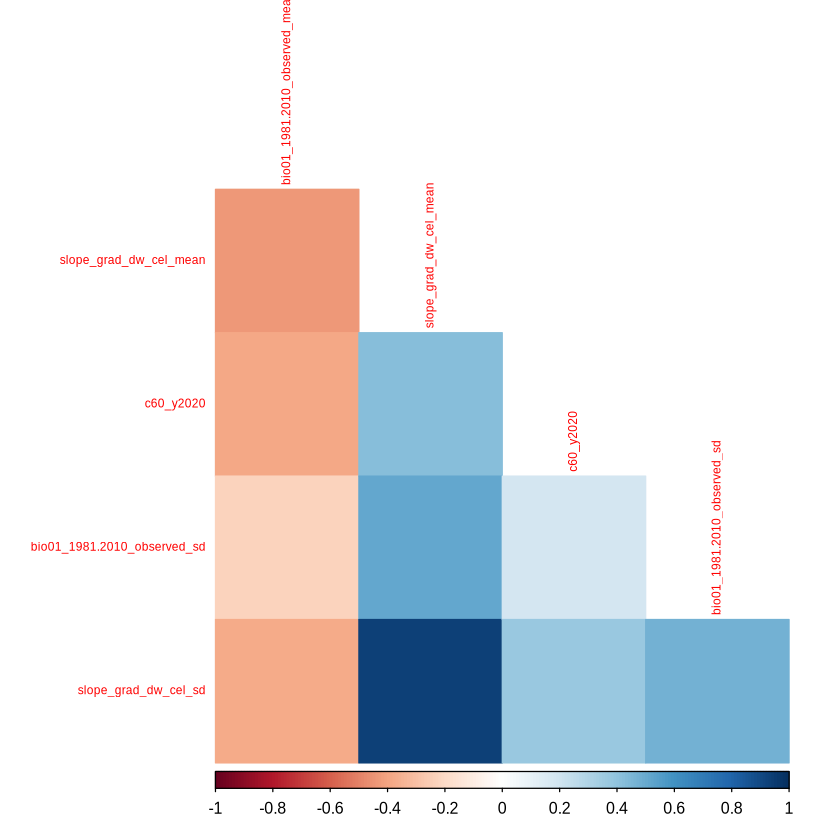

In [55]:
# Select numeric predictor variables (mean values only)
numeric_vars <- pred_tab %>%
  dplyr::select(where(is.numeric)) %>%
  dplyr::select(ends_with("_mean") | ends_with("2020") | ends_with("_sd"))

# Compute correlation matrix
cor_matrix <- cor(numeric_vars, use = "complete.obs")

# Visualize correlations
corrplot(cor_matrix, method = "color", type = "lower", tl.cex = 0.6, diag = FALSE)



High pairwise correlations (|r| > 0.7) indicate potential redundancy. To refine our predictor set, we can use the function `vifstep()` from the usdm package, which sequentially removes variables with high VIF values until all remaining predictors are below a given threshold (here we use 10 as the standard limit).

In [62]:
# Perform Variance Inflation Factor (VIF) analysis
vif_results <- vifstep(numeric_vars, th = 9)

In [63]:
# Display the selected variables (after removing collinear ones)
vif_results@results
selected_vars <- vif_results@results$Variables
selected_vars

Variables,VIF
<chr>,<dbl>
bio01_1981.2010_observed_mean,1.259453
c60_y2020,1.272776
bio01_1981.2010_observed_sd,1.284880
slope_grad_dw_cel_sd,1.485542


[1] "bio01_1981.2010_observed_mean" "c60_y2020"                    
[3] "bio01_1981.2010_observed_sd"   "slope_grad_dw_cel_sd"

We can then subset the prediction table to keep only the selected, non-collinear predictors:

In [65]:
# Filter the table to retain only selected (non-collinear) variables
pred_tab <- pred_tab %>%
  dplyr::select(any_of(c("subcID", selected_vars)))

# Check final  predictors
names(pred_tab)

[1] "subcID"                        "bio01_1981.2010_observed_mean"
[3] "c60_y2020"                     "bio01_1981.2010_observed_sd"  
[5] "slope_grad_dw_cel_sd"

## Model Table

The next step is to prepare the model fit table, which will serve as the input for model calibration. In this table, we link the sub-catchments containing *Atherina boyeri* occurrence points with the environmental data previously compiled in the prediction table. We will build this table step by step.

Most species distribution modeling (SDM) algorithms require both presence and absence (or pseudoabsence) data. Because we lack true absences for *Atherina boyeri*, we will generate pseudoabsence points. 

As Random Forest (RF) models are robust but benefit from a balanced ratio of presence to absence data, we will generate approximately two pseudoabsences for every presence record to improve model stability and predictive accuracy.

In [66]:
# Define number of pseudoabsences (2x presences)
n_pseudoabs <- nrow(gbif_snap_result) * 2  

# Ensures reproducibility of random sampling
set.seed(123)
# Randomly sample sub-catchments where the species was not observed
df_pseudoabs <- pred_tab %>%
  filter(!subcID %in% gbif_snap_result$subc_id) %>%      # exclude presence sub-catchments
  slice_sample(n = n_pseudoabs) %>%                      # randomly select pseudoabsences
  mutate(PresAbs = 0)                                    # mark as absences


In [67]:
# Generate a data frame with presences
df_pres <- pred_tab %>%
  filter(subcID %in% gbif_snap_result$subc_id) %>% # include presence sub-catchments
  mutate(PresAbs = 1) # mark as presence

In [68]:
# Merge data frame with presences and data frame with pseudo absences to create
# the model fit table
model_fit_table <- df_pres %>%
  bind_rows(df_pseudoabs)

In [69]:
# Inspect the model fit table
head(model_fit_table)
table(model_fit_table$PresAbs)
# Check that column names of model_fit_table and predict_table are the same
model_fit_table <- model_fit_table %>%
  select(any_of(c(names(pred_tab), "PresAbs")))

,subcID,bio01_1981.2010_observed_mean,c60_y2020,bio01_1981.2010_observed_sd,slope_grad_dw_cel_sd,PresAbs
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,514697892,2907.62,0.62,1.95,72668.74,1
2,514703088,2902.18,0.12,4.53,197316.67,1
3,514704927,2907.00,0.00,0.00,46008.03,1
4,514704931,2897.01,0.14,3.92,152835.13,1
5,514711291,2898.76,0.00,2.21,226117.40,1
6,514711523,2900.75,0.06,2.44,36901.17,1



  0   1 
174  72 

The resulting table will contain:

- The sub-catchment IDs,

- A binary column indicating species presence (1) or pseudoabsence (0), and

- The values of all environmental predictors for each sub-catchment.

In [44]:
names(gbif_snap_result)

[1] "gbifID"                    "subc_id"                  
[3] "strahler"                  "decimalLongitude_snapped" 
[5] "decimalLongitude_original" "decimalLatitude_snapped"  
[7] "decimalLatitude_original"  "distance_metres"

## Model Training

After preparing the model fit table, we will train a Species Distribution Model to predict the potential distribution of ** across .
Among the many statistical and machine-learning techniques available for SDMs, we will use a Random Forest (RF) algorithm, a non-parametric ensemble method that efficiently handles large datasets, nonlinear relationships, and interactions between predictors while providing robust predictive performance.

Before model training, we must ensure that the presence–absence column is formatted as a factor and that there are no missing values in the dataset.

In [70]:
# Convert presence-absence column to factor
model_fit_table$PresAbs <- as.factor(model_fit_table$PresAbs)
model_fit_table <- na.omit(model_fit_table)

To obtain an unbiased assessment of model performance, we will split the dataset into training and testing subsets.
The training subset (e.g., 70% of the data) will be used to fit the model, while the testing subset (30%) will serve for independent validation.

In [71]:
set.seed(123) # for reproducibility

# Split data: 70% for training, 30% for testing. Train-test split are stratified by the PresAbs column to preserve the class ratio in both subsets.
train_index <- createDataPartition(model_fit_table$PresAbs, p = 0.7, list = FALSE)
train_data <- model_fit_table[train_index, ]
test_data  <- model_fit_table[-train_index, ]

In [72]:
names(train_data)

[1] "subcID"                        "bio01_1981.2010_observed_mean"
[3] "c60_y2020"                     "bio01_1981.2010_observed_sd"  
[5] "slope_grad_dw_cel_sd"          "PresAbs"

Now we are ready to train the Random Forest model.
We will use the `ranger()` function from the `ranger` R package, which provides a fast and efficient implementation of Random Forests.

In [73]:
# Train the Random Forest model
rf_model <- ranger(
  formula = train_data$PresAbs ~ .,
  data = train_data[, 2:ncol(train_data)],
  replace = TRUE,
  probability = TRUE,
  importance = "impurity"
)

## Model testing

We will assess model performance using the **Area Under the Receiver Operating Characteristic Curve (AUC)**.  
The AUC is widely used in SDM studies to assess the discriminative ability of a model across all possible classification thresholds (i.e. its ability to differentiate presence vs absence).  
However, it should be interpreted with caution — its value can be influenced by prevalence, spatial bias, and sampling scheme (e.g. presence-only vs presence–absence).

In [74]:
# Predict probabilities for the test dataset
rf_pred <- predict(rf_model, data = test_data)$predictions
test_data$pred_prob <- rf_pred[, 2]  # probability of presence

# Compute AUC
roc_obj <- roc(test_data$PresAbs, test_data$pred_prob)
auc_value <- auc(roc_obj)
print(paste("AUC =", round(auc_value, 3)))

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[1] "AUC = 0.967"


## Spatial projection

We will use the fitted model to predict the probability of occurrence of *Atherina boyeri* across all stream segments in the study area.

In [94]:
# Predict probabilities
rf_pred_list <- predict(rf_model, data = pred_tab[, 2:ncol(pred_tab)])

# Probability of presence in the second column
pred_v <- rf_pred_list[["predictions"]][,2]

# Round and integer
pred_v <- as.integer(round(pred_v, 2) * 100)

# Data frame with IDs and predictions
pred_df <- data.frame("subc_id" = pred_tab$subcID, "suitability" = pred_v)


The predictions consist of two probability columns: one for absence and one for presence.
We will focus on the probability of presence (the second column) as our measure of habitat suitability.

In [95]:
# Check the first rows of predictions
head(pred_df)

,subc_id,suitability
,<int>,<int>
1,514695949,91
2,514695950,89
3,514696047,85
4,514696049,84
5,514696323,91
6,514696324,89


Finally, we will join the data frame with predicted probabilities to the spatial object with stream segments in order to create a habitat suitability map.

In [90]:
# 
stream <- st_read("spatial/stream_networks//partial_stream_network.gpkg")
names(stream)

# Join streams and suitability 
stream_suit <- stream %>%
inner_join(pred_df, by = c("subc_id" = "subc_id"))


Reading layer `partial_stream_network' from data source 
  `/home/participant/data_write/spatial/stream_networks/partial_stream_network.gpkg' 
  using driver `GPKG'
Simple feature collection with 125209 features and 5 fields (with 16 geometries empty)
Geometry type: LINESTRING
Dimension:     XY
Bounding box:  xmin: 19.3121 ymin: 34.9354 xmax: 28.2346 ymax: 42.8104
Geodetic CRS:  WGS 84


[1] "subc_id"        "target"         "length"         "strahler_order"
[5] "basin_id"       "geom"

Visualizing spatial projection

In [100]:

pal <- colorNumeric(
  palette = hcl.colors(256, "Inferno"),
  domain = stream_suit$suitability,
  na.color = "transparent"
)


occ_pts_sf <- st_as_sf(gbif_snap_result, coords = c("decimalLongitude_snapped", "decimalLatitude_snapped"))

leaflet() %>%
  addTiles() %>%
  addPolylines(
    data = stream_suit,
    color = ~pal(suitability),
    weight = 1,
    opacity = 0.7
  ) %>%
   addCircles(
     data = occ_pts_sf,
     color = "blue",
     fillColor = "white",
     fillOpacity = 0.7,
     radius = 100
   ) %>%
  addLegend(
    pal = pal,
    values = stream_suit$suitability,
    title = "Habitat suitability<br><i>Atherina boyeri</i>"
  )

HTML widgets cannot be represented in plain text (need html)